# Advanced Lane Finding Project

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Distortion

In [235]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
%matplotlib inline

Image shape is  (720, 1280, 3)


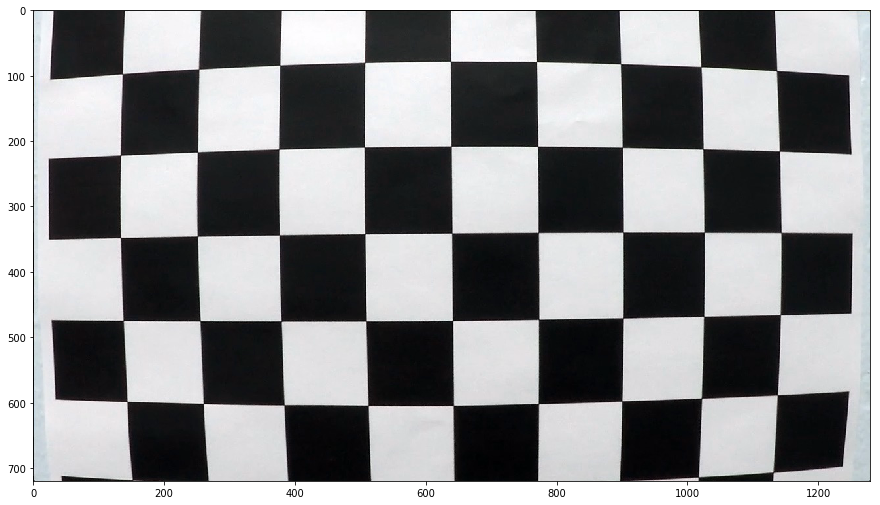

In [236]:
fname = 'camera_cal/calibration1.jpg'
img = cv2.imread(fname)
image_shape = img.shape

plt.figure(figsize = (15, 15))
plt.imshow(img)

print("Image shape is ", image_shape)

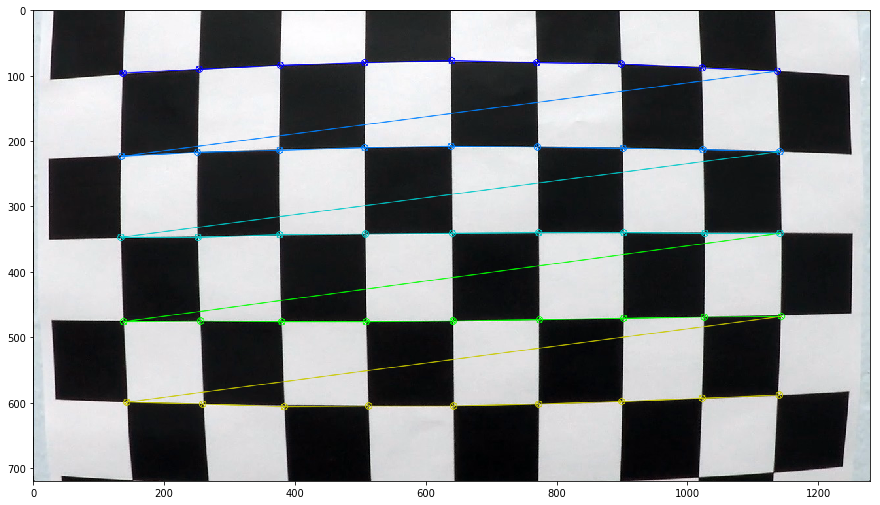

In [237]:
# prepare object points
nx = 9 # number of inside corners in x
ny = 5 # number of inside corners in y

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.figure(figsize = (15, 15))
    plt.imshow(img)

### Calibrate the camera

Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

OpenCV functions or other methods were used to calculate the correct camera matrix and distortion coefficients using the calibration chessboard images provided in the repository (note these are 9x6 chessboard images, unlike the 8x6 images used in the lesson). The distortion matrix should be used to un-distort one of the calibration images provided as a demonstration that the calibration is correct. Example of undistorted calibration image is Included in the writeup (or saved to a folder).

In [238]:
nx = 9
ny = 6

def calibrate_camera(imgs_names):
    
    # Create figure
    fig, axes = plt.subplots(5, 4, figsize = (15, 10))
    axes = axes.ravel()

    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane

    # Prepare object points
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[ : , : 2] =  np.mgrid[0 : nx, 0: ny].T.reshape(-1, 2) # x,y coordinates 
    
    # Repeat procedure for all calibration images
    for (i, img_name) in enumerate(imgs_names):
        
        # Read image
        img = cv2.imread(img_name)

        # Convert image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the Chesse board corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
            # Show image
            axes[i].axis('off')
            axes[i].imshow(img)
        else:
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

            if ret == True:
                imgpoints.append(corners)
                objpoints.append(objp)

                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (nx, ny - 1), corners, ret)

                # Show image
                axes[i].axis('off')
                axes[i].imshow(img)
            
    return objpoints, imgpoints

In [239]:
DO_SAVE = 0 # load is 0 - loads from the pickle, 1 is save

In [240]:
# Pickle results if they take too long
import pickle

# Load or save the data
calibration_pickle = "camera_calibration.pkl"

def camera_calibration_save_data(filename, objpoints, imgpoints):
    # Create new dictionary
    save = { }
    save["imgpoints"] = imgpoints
    save["objpoints"] = objpoints
    pickle.dump(save, open(filename, "wb"))
    
def camera_calibration_load_data(filename):
    # Create new dictionary
    load = pickle.load(open(filename, "rb"))
    return load

In [241]:
import glob as gb

img_names = gb.glob("camera_cal/calibration*.jpg")
images  = gb.glob("test_images/*.jpg")
print(img_names)

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

if (DO_SAVE == 0):
    print("Loading ready calibration data from pickle...")
    load = camera_calibration_load_data(calibration_pickle)
    print(load)
    objpoints, imgpoints = load["objpoints"], load["imgpoints"]
else:
    print("calibrating data and saving to pickle...")
    objpoints, imgpoints = calibrate_camera(img_names)
    camera_calibration_save_data(calibration_pickle, objpoints, imgpoints)

['camera_cal/calibration8.jpg', 'camera_cal/calibration2.jpg', 'camera_cal/calibration19.jpg', 'camera_cal/calibration9.jpg', 'camera_cal/calibration3.jpg', 'camera_cal/calibration14.jpg', 'camera_cal/calibration10.jpg', 'camera_cal/calibration11.jpg', 'camera_cal/calibration16.jpg', 'camera_cal/calibration7.jpg', 'camera_cal/calibration20.jpg', 'camera_cal/calibration6.jpg', 'camera_cal/calibration4.jpg', 'camera_cal/calibration18.jpg', 'camera_cal/calibration5.jpg', 'camera_cal/calibration15.jpg', 'camera_cal/calibration12.jpg', 'camera_cal/calibration13.jpg', 'camera_cal/calibration17.jpg', 'camera_cal/calibration1.jpg']
Loading ready calibration data from pickle...
{'imgpoints': [array([[[ 710.16033936,  216.4934845 ]],

       [[ 752.68963623,  220.50062561]],

       [[ 791.7744751 ,  224.12162781]],

       [[ 828.68286133,  227.71450806]],

       [[ 863.09954834,  231.33512878]],

       [[ 895.19213867,  234.44940186]],

       [[ 924.91137695,  238.00427246]],

       [[ 953

In [242]:
def do_undistort(imgs_names, objpoints, imgpoints):
    
    # Create figure
    fig, axes = plt.subplots(len(imgs_names), 2, figsize = (15, 5 * len(imgs_names)))
    axes = axes.ravel()

    # Repeat procedure for all calibration images
    for (i, img_name) in enumerate(imgs_names):
        
        # Read image
        img = cv2.imread(img_name)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_size = (img.shape[1], img.shape[0])
        
        # Do camera undistort
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        dst = cv2.undistort(img, mtx, dist, None, mtx)

        # Show image
        axes[(i * 2)].imshow(img)
        axes[(i * 2) + 1].imshow(dst)
        
def undistort(imgs_vec, objpoints, imgpoints):
    
    # Return vector of images
    imgs = []

    # Repeat procedure for all calibration images
    for (i, img_current) in enumerate(imgs_vec):
        
        # Get image size
        img_size = (img_current.shape[1], img_current.shape[0])
        
        # Do camera undistort
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        dst = cv2.undistort(img_current, mtx, dist, None, mtx)
        
        # Append to results
        imgs.append(dst)
    
    return imgs

In [243]:
#do_undistort(img_names, objpoints, imgpoints)

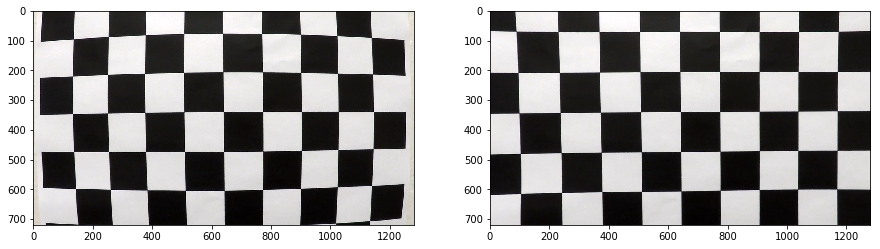

In [244]:
do_undistort([img_names[19]], objpoints, imgpoints)
plt.savefig("output_images/camera_calibration.jpg")

### Demonstrate undistortion on sample image from the road


Provide an example of a distortion-corrected image.

Distortion correction that was calculated via camera calibration has been correctly applied to each image. An example of a distortion corrected image should be included in the writeup (or saved to a folder) and submitted with the project.


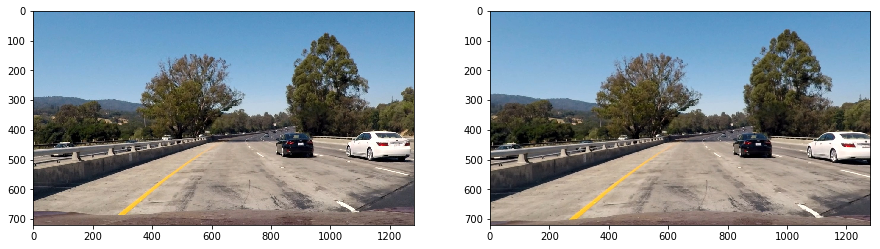

In [20]:
do_undistort(["test_images/test1.jpg"], objpoints, imgpoints)
plt.savefig("output_images/undistort_test_image.jpg")

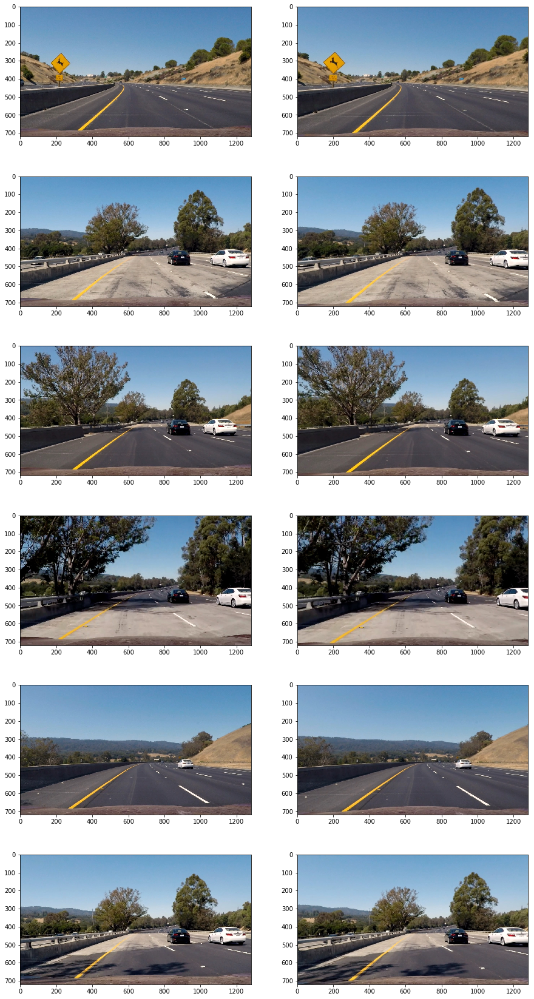

In [21]:
do_undistort(gb.glob("test_images/test*.jpg"), objpoints, imgpoints)

### Combination of methods 

#### Color transform, gradients for binary image containing likely lane pixels

Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

A method or combination of methods (i.e., color transforms, gradients) has been used to create a binary image containing likely lane pixels. There is no "ground truth" here, just visual verification that the pixels identified as part of the lane lines are, in fact, part of the lines. Example binary images should be included in the writeup (or saved to a folder) and submitted with the project.

In [271]:
def abs_sobel_thresh(img, orient = 'x', sobel_kernel = 15, thresh_min = 20, thresh_max = 120):
    # Grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Apply cv2.Sobel()
    sobel = 0

    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    elif (orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    # Take the absolute value of the output from cv2.Sobel()
    abs_sobel = np.absolute(sobel)

    # Scale the result to an 8-bit range (0-255)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))

    # Apply lower and upper thresholds
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Create binary_output
    return binary_output

In [272]:
def mag_thresh(img, sobel_kernel = 3, mag_thresh = (30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    # 3) Calculate the magnitude 
    abs_sobelx  = np.sqrt(pow(sobelx, 2))
    abs_sobely  = np.sqrt(pow(sobely, 2))
    abs_sobelxy = np.sqrt(pow(sobelx, 2) + pow(sobely, 2))

    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobelxy / np.max(abs_sobelxy))

    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output

In [273]:
def dir_threshold(img, sobel_kernel = 15, thresh = (np.pi/4, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # 2) Take the gradient in x and y separately
    #sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    #sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = 15)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = 15)


    # 3) Take the absolute value of the x and y gradients
    abs_sobelx  = np.sqrt(pow(sobelx, 2))
    abs_sobely  = np.sqrt(pow(sobely, 2))

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir = np.arctan2(abs_sobely, abs_sobelx)

    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir)
    binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output

In [274]:
def combine_thresholds(img, ksize = 7):
    # X, Y gradiets, magnitude of gradient and direction of gradient thresholds
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel = 15, thresh_min = 20, thresh_max = 120) # was 20-100
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel = 15, thresh_min = 20, thresh_max = 120)
    mag_binary = mag_thresh(img, sobel_kernel = 15, mag_thresh = (80, 200)) # was 30-100
    dir_binary = dir_threshold(img, sobel_kernel = ksize, thresh=(0, np.pi/2))

    # Combine thresholds
    #combined = np.zeros_like(gradx)
    combined = np.zeros_like(dir_binary)
    combined[(gradx == 1) & ((grady == 1) | (mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1))] = 1
    
    kernel = np.ones((3, 3), np.uint8)
    combined = cv2.morphologyEx(combined.astype(np.uint8), cv2.MORPH_OPEN, kernel)
    
    return combined

(1280, 720)


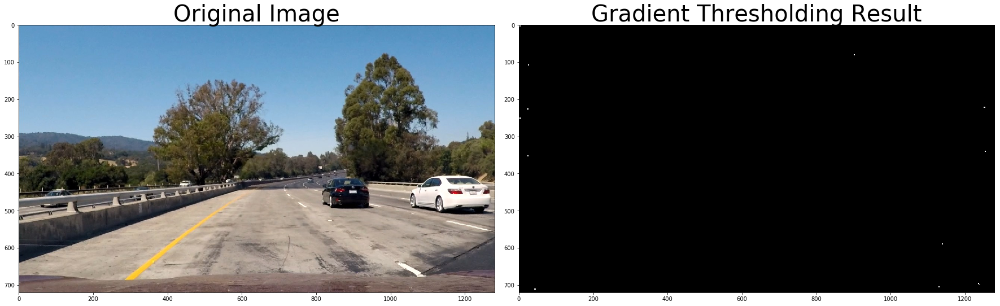

In [275]:
img = cv2.cvtColor(cv2.imread("test_images/test1.jpg"), cv2.COLOR_BGR2RGB)

img_size = (img.shape[1], img.shape[0])
print(img_size)

ksize = 7

# Get thresholds
result = combine_thresholds(img, ksize)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Gradient Thresholding Result', fontsize = 40)
plt.subplots_adjust(left = 0., right = 1, top = 0.9, bottom = 0.)
plt.savefig("output_images/gradient_thresholding.jpg")

#### Color spaces

In [276]:
# Starting point is code from lesson

def hls_sthreshold(img, s_thresh = (120, 255)):
    
    # Convert to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Select saturation
    s_channel = hls[ : , : , 2]
    
    # Threshold s chnnel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    return s_binary

In [277]:
# This is my own doing - it appears we need to select for lightness - all lane markings are light, be them yellow or white

# Used  a color picker to see wat is what: http://colorizer.org/

def hls_lthreshold(img, l_thresh = (110, 255)):
    
    # Convert to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Select saturation
    l_channel = hls[ : , : , 1]
    
    # Threshold s chnnel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    return l_binary

In [278]:
def combine_color_thresholds_old(img):
    # Get both thresholds
    s_thresh = hls_sthreshold(img)
    l_thresh = hls_lthreshold(img)

    # Combine thresholds
    combined = np.zeros_like(s_thresh)
    
    # Used the OR operation
    combined[(s_thresh == 1) & (l_thresh == 1)] = 1
    
    kernel = np.ones((9, 9), np.uint8)
    combined = cv2.morphologyEx(combined.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    #combined = cv2.morphologyEx(combined.astype(np.uint8), cv2.MORPH_OPEN, kernel)
    #combined[(s_thresh == 1)] = 1
    
    return combined

def combine_color_thresholds(img):
    """
    Returns a binary thresholded image produced retaining only white and yellow elements on the picture
    The provided image should be in RGB format
    """
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Compute a binary thresholded image where yellow is isolated from HLS components
    img_hls_yellow_bin = np.zeros_like(hls_img[:,:,0])
    img_hls_yellow_bin[((hls_img[:,:,0] >= 15) & (hls_img[:,:,0] <= 35))
                 & ((hls_img[:,:,1] >= 30) & (hls_img[:,:,1] <= 204))
                 & ((hls_img[:,:,2] >= 115) & (hls_img[:,:,2] <= 255))                
                ] = 1
    
    # Compute a binary thresholded image where white is isolated from HLS components
    img_hls_white_bin = np.zeros_like(hls_img[:,:,0])
    img_hls_white_bin[((hls_img[:,:,0] >= 0) & (hls_img[:,:,0] <= 255))
                 & ((hls_img[:,:,1] >= 200) & (hls_img[:,:,1] <= 255))
                 & ((hls_img[:,:,2] >= 0) & (hls_img[:,:,2] <= 255))                
                ] = 1
    
    # Now combine both
    img_hls_white_yellow_bin = np.zeros_like(hls_img[:,:,0])
    img_hls_white_yellow_bin[(img_hls_yellow_bin == 1) | (img_hls_white_bin == 1)] = 1

    return img_hls_white_yellow_bin

(1280, 720)


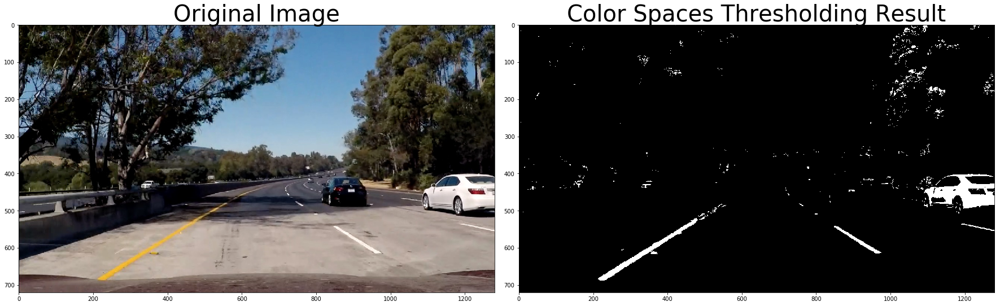

In [279]:
#img = cv2.cvtColor(cv2.imread("test_images/straight_lines1.jpg"), cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(cv2.imread("test_images/test5.jpg"), cv2.COLOR_BGR2RGB)

img_size = (img.shape[1], img.shape[0])
print(img_size)

# Get thresholds
result = combine_color_thresholds(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Color Spaces Thresholding Result', fontsize = 40)
plt.subplots_adjust(left = 0., right = 1, top = 0.9, bottom = 0.)
plt.savefig("output_images/color_spaces_thresholding.jpg")

#### Combined color spaces and gradient thresholding

In [280]:
def combine_all_thresholds(img):
    hls_thresh  = combine_color_thresholds(img)
    
    undist_img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)[:,:,0]
    grad_thresh = combine_thresholds(undist_img_gray)

    # Combine thresholds
    combined = np.zeros_like(hls_thresh)
    
    # Combine with OR
    combined[(hls_thresh == 1) | (grad_thresh == 1)] = 1
    
    return combined

In [281]:
def plot_filtered(img, imgf, name1 = 'Original Image', name2 = 'Result', figsize = (24, 9), cmap = 'gray'):

    # Print image size
    img_size = (img.shape[1], img.shape[0])
    #print(img_size)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = figsize)
    f.tight_layout()

    # Plot images
    ax1.imshow(img)
    ax1.set_title(name1, fontsize = 40)

    ax2.imshow(imgf, cmap = cmap)
    ax2.set_title(name2, fontsize = 40)
    plt.subplots_adjust(left = 0., right = 1, top = 0.9, bottom = 0.)


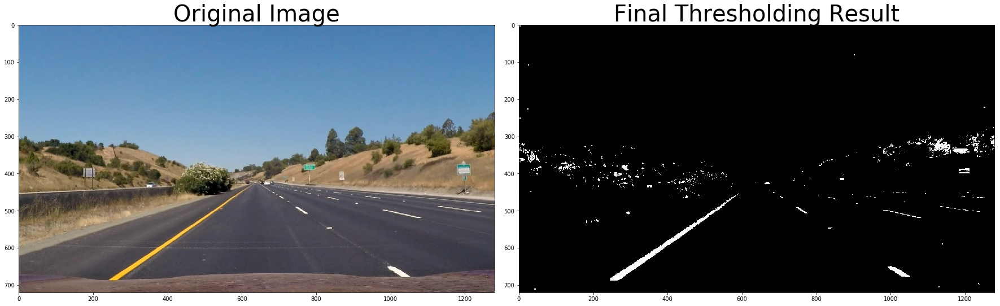

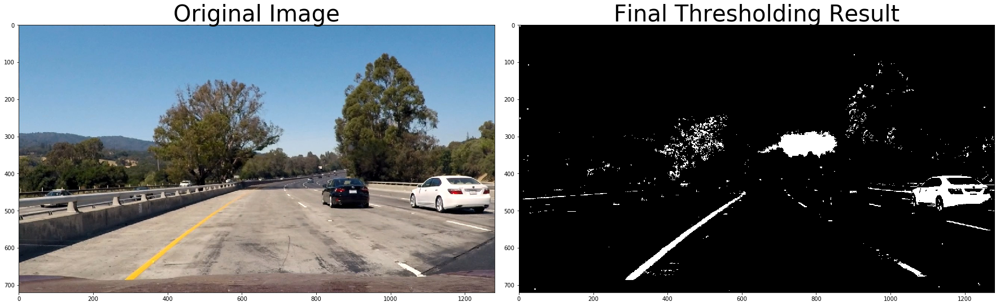

In [282]:
img = cv2.cvtColor(cv2.imread("test_images/straight_lines1.jpg"), cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(cv2.imread("test_images/test1.jpg"), cv2.COLOR_BGR2RGB)

# Plot
plot_filtered(img, combine_all_thresholds(img), name1 = 'Original Image', name2 = 'Final Thresholding Result')
plt.savefig("output_images/final_thresholding1.jpg")

plot_filtered(img1, combine_all_thresholds(img1), name1 = 'Original Image', name2 = 'Final Thresholding Result')
plt.savefig("output_images/final_thresholding2.jpg")

#### Perspective transform

Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

OpenCV function or other method has been used to correctly rectify each image to a "birds-eye view". Transformed images should be included in the writeup (or saved to a folder) and submitted with the project.

In [283]:
def perspective_transform(img, src, dst):
    
    # Get image size
    imgsize = [img.shape[1], img.shape[0]]
    #print("Image shape is ", imgsize)
    
    # Compute perspective transform
    M = cv2.getPerspectiveTransform(src, dst)

    # Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)

    return warped, Minv

(1280, 720)


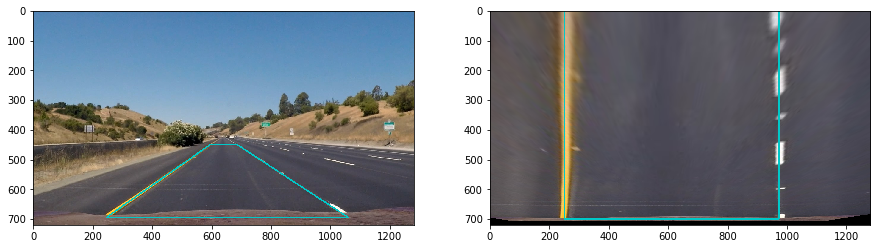

In [284]:
img = cv2.cvtColor(cv2.imread("test_images/straight_lines1.jpg"), cv2.COLOR_BGR2RGB)

img_size = (img.shape[1], img.shape[0])
print(img_size)

# Define points for transform - eye picked
src = np.float32([
                  ( 595, 450),
                  ( 685, 450), 
                  ( 245, 700 - 5), 
                  (1060, 700 - 5)
                 ])

dst = np.float32([(250, 0), # originally 250 and img_size + 300
                  (img_size[1] + 250, 0),
                  
                  (250, img_size[0] - 580),
                  (img_size[1] + 250, img_size[0] - 580)])

# Create warp
warped, _ = perspective_transform(img, src, dst)

# Draw src and dst point_lines on img
thickness = 4
cv2.line(img, tuple(src[0]), tuple(src[1]), (0, 200, 200), thickness)
cv2.line(img, tuple(src[1]), tuple(src[3]), (0, 200, 200), thickness)
cv2.line(img, tuple(src[2]), tuple(src[3]), (0, 200, 200), thickness)
cv2.line(img, tuple(src[2]), tuple(src[0]), (0, 200, 200), thickness)

# Draw src and dst point_lines on dst
thickness = 4
cv2.line(warped, tuple(dst[0]), tuple(dst[1]), (0, 200, 200), thickness)
cv2.line(warped, tuple(dst[1]), tuple(dst[3]), (0, 200, 200), thickness)
cv2.line(warped, tuple(dst[2]), tuple(dst[3]), (0, 200, 200), thickness)
cv2.line(warped, tuple(dst[2]), tuple(dst[0]), (0, 200, 200), thickness)

# Create figure
fig, axes = plt.subplots(1, 2, figsize = (15, 5))
axes = axes.ravel()

axes[0].imshow(img)
axes[1].imshow(warped)

plt.savefig("output_images/result_perspective.jpg")

### Define Pipeline

In [285]:
# Edit this function to create your own pipeline. <-- taken from lesson with my own edits
def pipeline(img, objpoints, imgpoints, s_thresh = (170, 255), sx_thresh = (20, 100)):
    
    # Undistort step
    imgu = undistort([img], objpoints, imgpoints)[0]
    
    # Perspective step
    imgw, Minv = perspective_transform(imgu, src, dst)
    
    # CLAHE brightness adjustment apply
    lab = cv2.cvtColor(imgw, cv2.COLOR_RGB2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize = (8,8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    imgw = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Thresholding
    imgt = combine_all_thresholds(imgw)
    
    return (imgt, Minv)

In [286]:
def imsave(fname, arr, vmin=None, vmax=None, cmap=None, format=None, origin=None):
    from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
    from matplotlib.figure import Figure

    fig = Figure(figsize=arr.shape[::-1], dpi=1, frameon=False)
    canvas = FigureCanvas(fig)
    fig.figimage(arr, cmap=cmap, vmin=vmin, vmax=vmax, origin=origin)
    fig.savefig(fname, dpi=1, format=format)

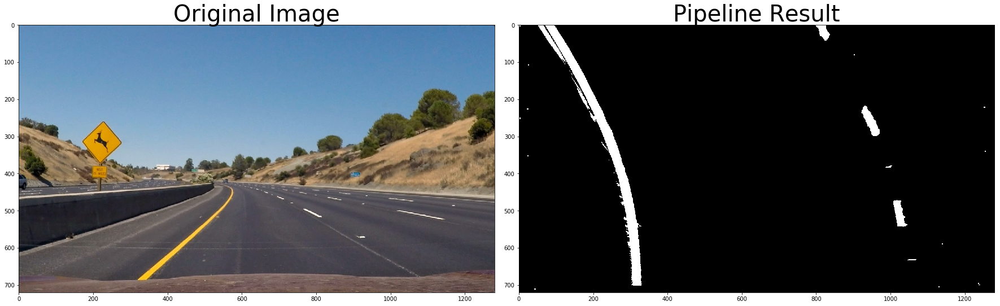

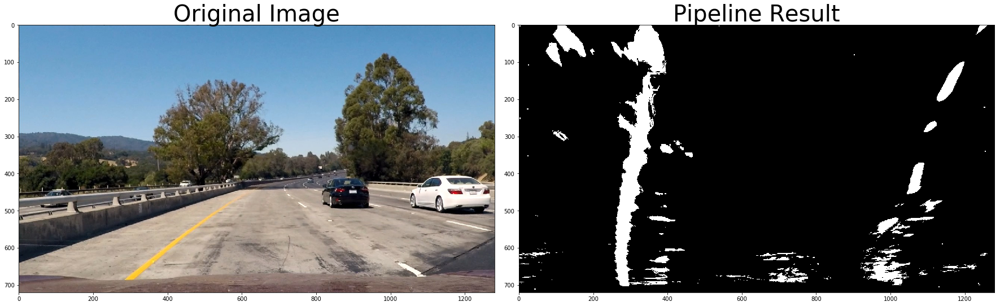

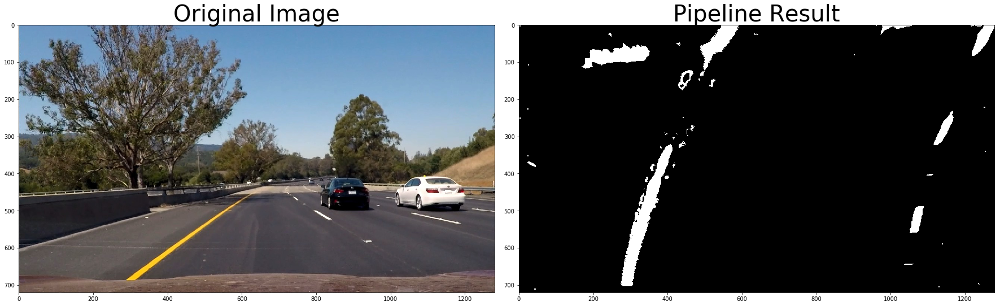

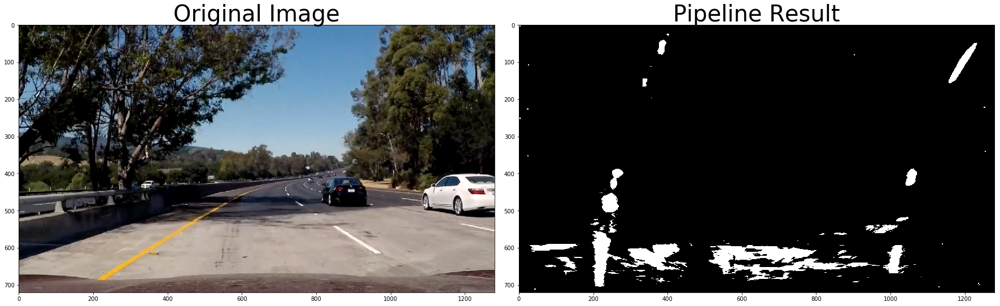

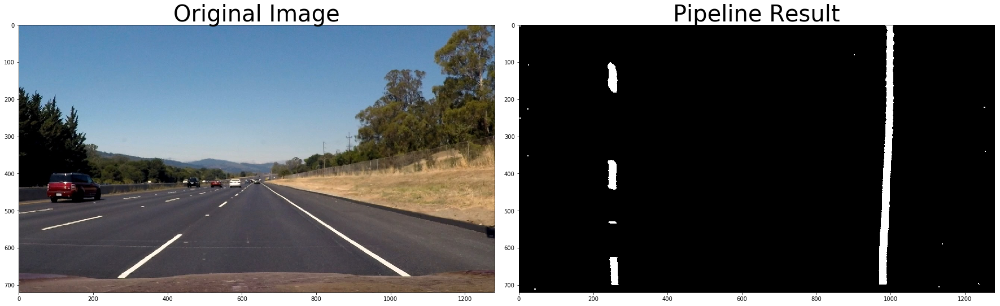

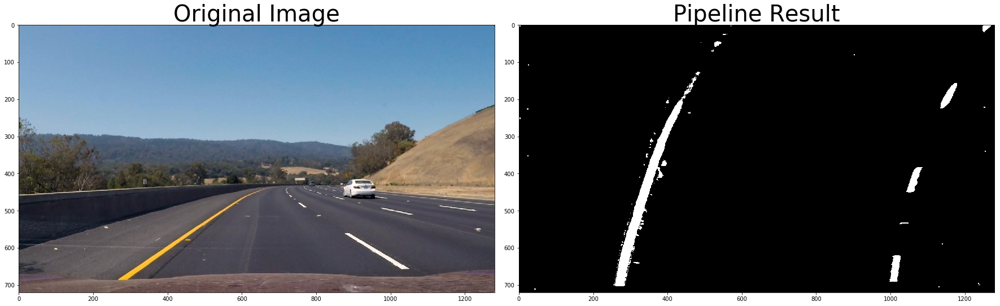

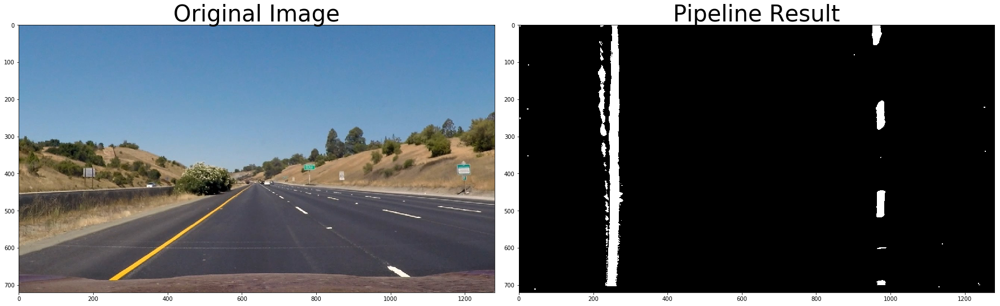

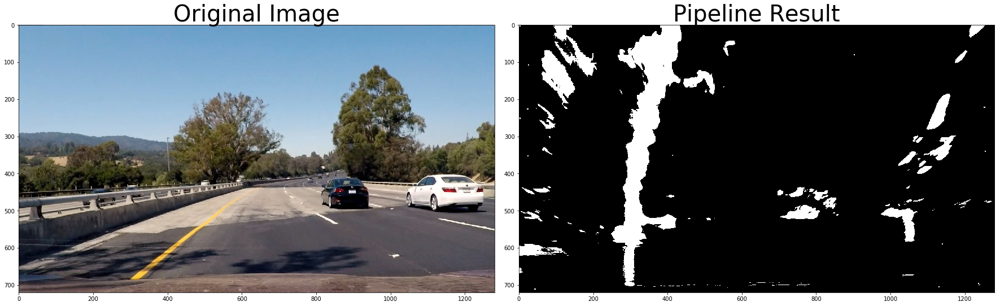

In [287]:
# Test pipeline
import os

images  = gb.glob("test_images/*.jpg")

for img_name in images:
    
    # Load image
    #img = cv2.imread(img_name, 1)
    img = cv2.cvtColor(cv2.imread(img_name), cv2.COLOR_BGR2RGB)

    # Pipeline it
    result, _ = pipeline(img, objpoints, imgpoints)

    # Plot result
    plot_filtered(img, result, name1 = 'Original Image', name2 = 'Pipeline Result')
    plt.savefig("output_images/comparison_" + os.path.basename(img_name))
    #imsave('output_images/result_' + os.path.basename(img_name) + ".png", result)
    cv2.imwrite('output_images/result_' + os.path.basename(img_name), result)

----------------------------------

# Detect lane pixels

Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

Methods have been used to identify lane line pixels in the rectified binary image. The left and right line have been identified and fit with a curved functional form (e.g., spine or polynomial). Example images with line pixels identified and a fit overplotted should be included in the writeup (or saved to a folder) and submitted with the project.

In [288]:
# Lesson 7 code as starting point
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0] // 2 : , : ]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

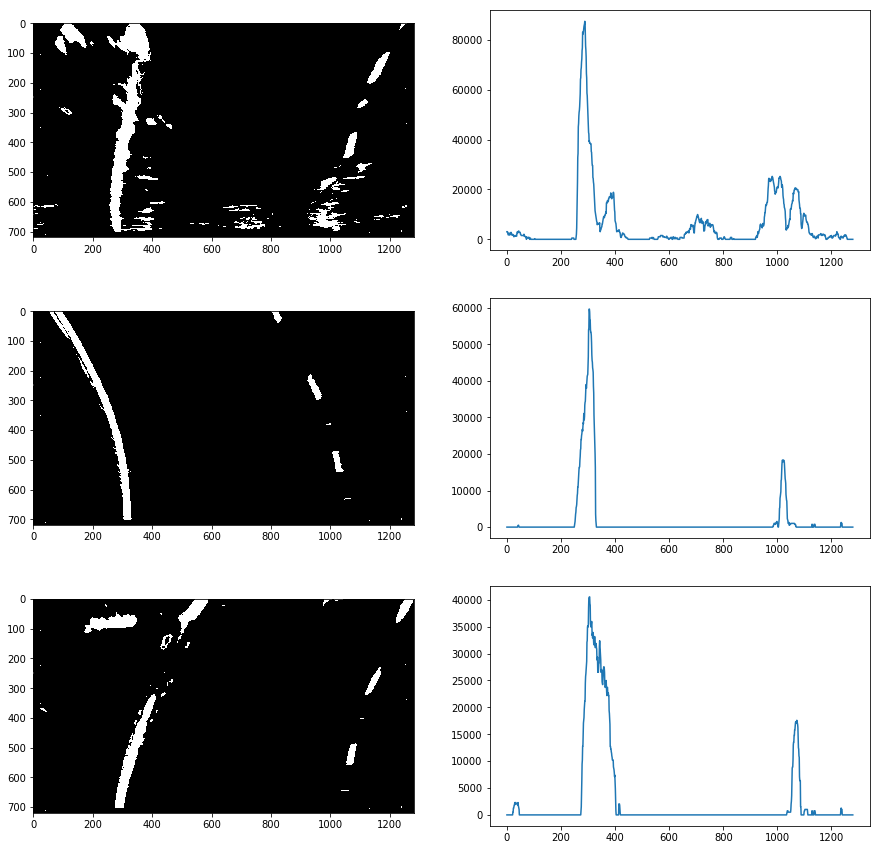

In [289]:
img_name = 'output_images/result_tests.jpg'
img = mpimg.imread('output_images/result_test1.jpg') * 255
img2 = mpimg.imread('output_images/result_test2.jpg') * 255
img3 = mpimg.imread('output_images/result_test6.jpg') * 255

# Create histogram of image binary activations
histogram = hist(img)
histogram2 = hist(img2)
histogram3 = hist(img3)

# Visualize the resulting histogram
f, axes = plt.subplots(3, 2, figsize = (15,5 * 3))
axes[0,0].imshow(img, cmap='gray')
axes[0,1].plot(histogram)
axes[1,0].imshow(img2, cmap='gray')
axes[1,1].plot(histogram2)
axes[2,0].imshow(img3, cmap='gray')
axes[2,1].plot(histogram3)

# Sve result
plt.savefig("output_images/histogram_" + os.path.basename(img_name))

In [290]:
# Used lesson code as starting reference here 
def find_lane_pixels(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2 : , : ], axis = 0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    #out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped)) * 255)
    #out_img = cv2.merge((binary_warped, binary_warped, binary_warped)).astype(np.uint8).copy()
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[ : midpoint])
    rightx_base = np.argmax(histogram[midpoint : ]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 150
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0] // nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low),  (win_xleft_high,win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high,win_y_high), (0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped, plot_lines = True):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_image = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx  = 1 * ploty ** 2 + 1 * ploty
        right_fitx = 1 * ploty ** 2 + 1 * ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_image[lefty, leftx] = [255, 0, 0]
    out_image[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    if (plot_lines == True):
        plt.plot( left_fitx, ploty, color = 'yellow')
        plt.plot(right_fitx, ploty, color = 'yellow')

    return (out_image, np.array(left_fit), np.array(right_fit), np.array(leftx), np.array(lefty), np.array(rightx), np.array(righty))

Polynomials : left  :  [  9.60035542e-05  -1.99562978e-01   3.90915375e+02]
            : right :  [  1.62615517e-04  -4.47494554e-01   1.23195470e+03]


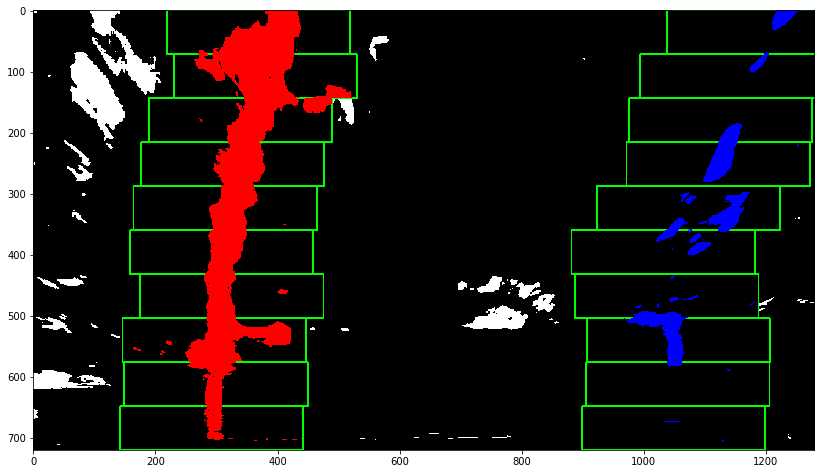

In [291]:
image_to_fit = mpimg.imread('output_images/result_test4.jpg') #cv2.imread('output_images/result_test2.jpg') 


(out, lf, rf, lx, ly, rx, ry) = fit_polynomial(image_to_fit, False)
print ("Polynomials : left  : ", lf)
print ("            : right : ", rf)

plt.figure(figsize = (14, 10))
plt.imshow(out)

Polynomials : left  :  [  5.80375219e-04  -6.48677079e-01   4.20742180e+02]
            : right :  [  2.70501927e-04  -6.35724508e-01   1.25520954e+03]


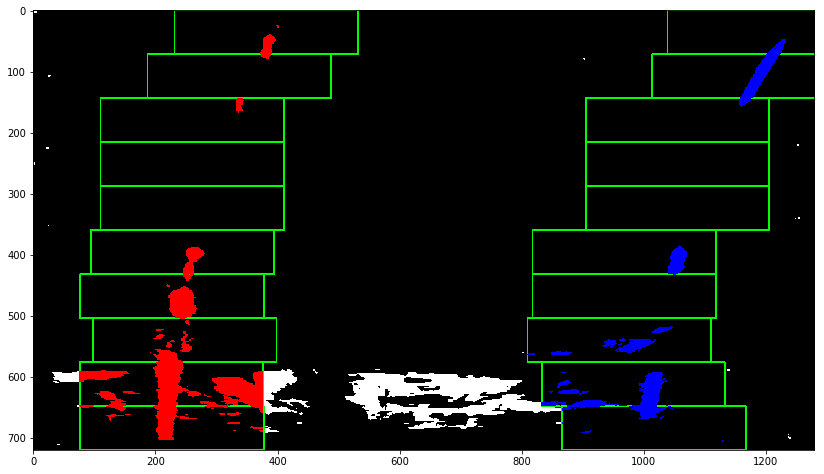

In [292]:
image_to_fit = mpimg.imread('output_images/result_test5.jpg') #cv2.imread('output_images/result_test2.jpg') 


(out, lf, rf, lx, ly, rx, ry) = fit_polynomial(image_to_fit, False)
print ("Polynomials : left  : ", lf)
print ("            : right : ", rf)

plt.figure(figsize = (14, 10))
plt.imshow(out)

['test_images/test2.jpg', 'test_images/test1.jpg', 'test_images/test6.jpg', 'test_images/test5.jpg', 'test_images/straight_lines2.jpg', 'test_images/test3.jpg', 'test_images/straight_lines1.jpg', 'test_images/test4.jpg']


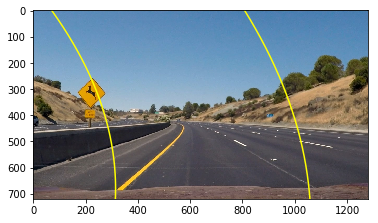

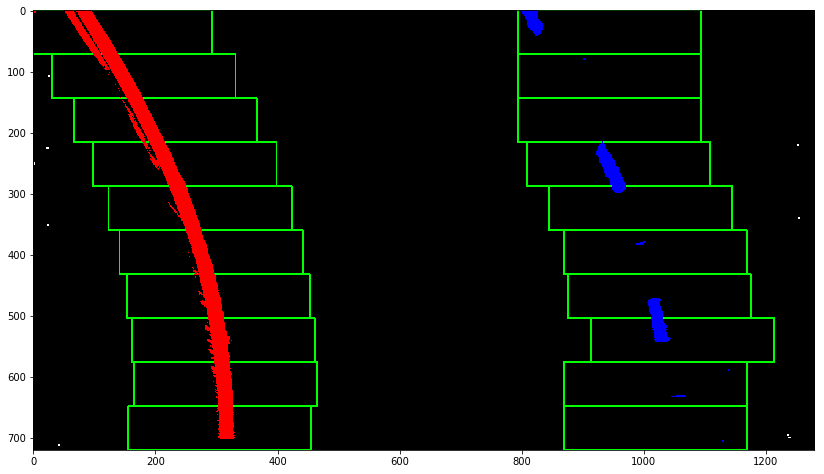

In [294]:
# Now attempt with pipeline image
print (images)

image1 = mpimg.imread(images[0])
plt.imshow(image1)

image_to_fit, _ = pipeline(image1, objpoints, imgpoints)

(out, _, _, _, _, _, _) = fit_polynomial(image_to_fit)

plt.figure(figsize = (14, 10))
plt.imshow(out)

In [296]:
#Ue Lesson 7, part 5 as starting point - fit previous value to it

#left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
#right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

margin_global = 100

def search_around_poly(binary_warped, left_fit, right_fit, plot_lines = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = margin_global

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    lf, rf = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    
    #lf, rf, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    if (plot_lines == True):
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return (result, np.array(left_fit), np.array(right_fit), np.array(leftx), np.array(lefty), np.array(rightx), np.array(righty))

def search_around_poly_without_image(binary_warped, left_fit, right_fit, plot_lines = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = margin_global

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    # Fit new polynomials
    #lf, rf = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    # Generate a polygon to illustrate the search window area
    
    return (result, np.array(left_fit), np.array(right_fit), np.array(leftx), np.array(lefty), np.array(rightx), np.array(righty))

[  1.15040874e-04  -3.87969269e-01   5.03930473e+02] [  2.44790554e-04  -4.95201371e-01   1.26310129e+03]
[  2.58388000e-04  -5.68725537e-01   5.58688270e+02] [  2.52848615e-04  -5.00066220e-01   1.26328035e+03]


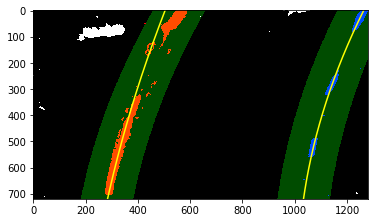

In [297]:
image1 = mpimg.imread(images[2])
plt.imshow(image1)

image_to_fit, _ = pipeline(image1, objpoints, imgpoints)

# First step for first poly
res, left_p, right_p, lx, ly, rx, ry = fit_polynomial(image_to_fit)
print(left_p, right_p)

# Update polys
result, new_left_p, new_right_p, _, _, _, _ = search_around_poly(image_to_fit, left_p, right_p)
print(new_left_p, new_right_p)

# View your output
plt.imshow(result)
plt.savefig("output_images/binary_lines.jpg")

### Curvature

Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

Here the idea is to take the measurements of where the lane lines are and estimate how much the road is curving and where the vehicle is located with respect to the center of the lane. The radius of curvature may be given in meters assuming the curve of the road follows a circle. For the position of the vehicle, you may assume the camera is mounted at the center of the car and the deviation of the midpoint of the lane from the center of the image is the offset you're looking for. As with the polynomial fitting, convert from pixels to meters.

In [298]:
# Globals
# Define conversions in x and y from pixels space to meters
# Lane line is  12 ft in y direction = 3.7meters ... pixels around 770 on x, 720 on y, and length y = 40m (eyeball)
   
ym_per_pix =  40 / 600
xm_per_pix = 3.7 / 650

def measure_curvature_real(img, leftx, lefty, rightx, righty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    #ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0]) # Get linspace of height for plotting
    y_eval = np.max(ploty)
    
    left_fit_cr  = np.polyfit( lefty * ym_per_pix,  leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
        
    A = left_fit_cr[0]
    B = left_fit_cr[1]
    C = left_fit_cr[2]
    left_curverad = (1 + (2*A*y_eval * ym_per_pix + B)**2)**(1.5) / np.abs(2*A)  ## Implement the calculation of the left line here
    A = right_fit_cr[0]
    B = right_fit_cr[1]
    C = right_fit_cr[2]
    right_curverad = (1 + (2*A*y_eval * ym_per_pix + B)**2)**(1.5) / np.abs(2*A)  ## Implement the calculation of the right line here
    
    return left_curverad, right_curverad

In [299]:
def poly(left, right, pos):
    lfit =  left[0] * pos ** 2 +  left[1] * pos +  left[2]
    rfit = right[0] * pos ** 2 + right[1] * pos + right[2]
    
    return (lfit, rfit)

In [300]:
def measure_offset(ploty, left_fit_cr, right_fit_cr):
    
    # Measure offset from center only if fit not empty
    if ((left_fit_cr != None) and (right_fit_cr != None)):
        
        # Current position of car assumed to be at center of image
        pos = img.shape[1] / 2

        # Get fit of bottom-most position
        (lfit, rfit) = poly(left_fit_cr, right_fit_cr, img.shape[0])
        actual_center = (lfit + rfit) / 2

        return (actual_center - pos) * xm_per_pix

[  1.15040874e-04  -3.87969269e-01   5.03930473e+02] [  2.44790554e-04  -4.95201371e-01   1.26310129e+03]
[[0 0 0 ..., 1 1 1]
 [0 0 0 ..., 1 1 1]
 [0 0 1 ..., 1 1 1]
 ..., 
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]]
 Left curve radius :  3395.33095364
Right curve radius :  1595.1511361


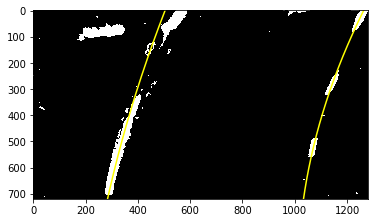

In [301]:
image1 = mpimg.imread(images[2])
plt.imshow(image1)

image_to_fit, _ = pipeline(image1, objpoints, imgpoints)

# First step for first poly
res, left_p, right_p, leftx, lefty, rightx, righty = fit_polynomial(image_to_fit)
print(left_p, right_p)

plt.imshow(image_to_fit, cmap='gray')

print(image_to_fit)

# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(image_to_fit, leftx, lefty, rightx, righty)
print(" Left curve radius : ", left_curverad)
print("Right curve radius : ", right_curverad)

In [302]:
# Calculate offset
print(left_p)
print(right_p)
print("Offset from center of lane (m) : ", measure_offset(image_to_fit, left_p, right_p))

[  1.15040874e-04  -3.87969269e-01   5.03930473e+02]
[  2.44790554e-04  -4.95201371e-01   1.26310129e+03]
Offset from center of lane (m) :  0.107258785895


Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

The fit from the rectified image has been warped back onto the original image and plotted to identify the lane boundaries. This should demonstrate that the lane boundaries were correctly identified. An example image with lanes, curvature, and position from center should be included in the writeup (or saved to a folder) and submitted with the project.

In [303]:
def make_line(img, left, right):
    
    ys = np.linspace(0, warped.shape[0] - 1, warped.shape[0])
    xpts =  left[0] * ys ** 2 +  left[1] * ys +  left[2]
    ypts = right[0] * ys ** 2 + right[1] * ys + right[2]
    
    return (ys, xpts, ypts)

In [304]:
def draw_result_warped(img, warped, left_fit, right_fit, Minv):
    
    # Create an image to draw the lines on
    res = np.zeros_like(warped)#.astype(np.uint8)
    res = np.dstack((res, res, res))

    # Make points from polyfit line
    ys, xpts, ypts = make_line(img, left_fit, right_fit)

    pts_left = np.array([np.transpose(np.vstack([ xpts, ys ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([ ypts, ys ])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw lane polys
    cv2.fillPoly(res, np.int_([pts]), [0, 200, 200])

    # Return combined unwarped and original
    return cv2.addWeighted(img, 1, cv2.warpPerspective(res, Minv, (img.shape[1], img.shape[0])) , 0.5, 0)

In [305]:
def draw_curve_sizes(img, curvature, offset):
    crv = (curvature[0] + curvature[1]) / 2
    if (crv > 8000):
        curvature_radius = "Basically straight."
    else:
        curvature_radius = "Curve radius = " + "{:04.2f}".format(crv) + "m"
        
    offset_text = "Car offset = " + "{:04.2f}".format(offset) + "m"
    
    # cv2.putText <- img, text , (x,y), font, size, color, thickness, line-type)
    cv2.putText(img, curvature_radius, (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 250, 250), 2, cv2.LINE_AA)
    cv2.putText(img, offset_text, (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 250, 250), 2, cv2.LINE_AA)

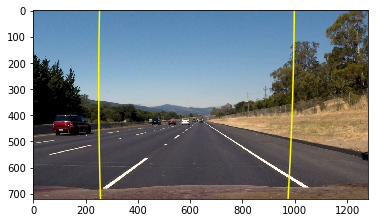

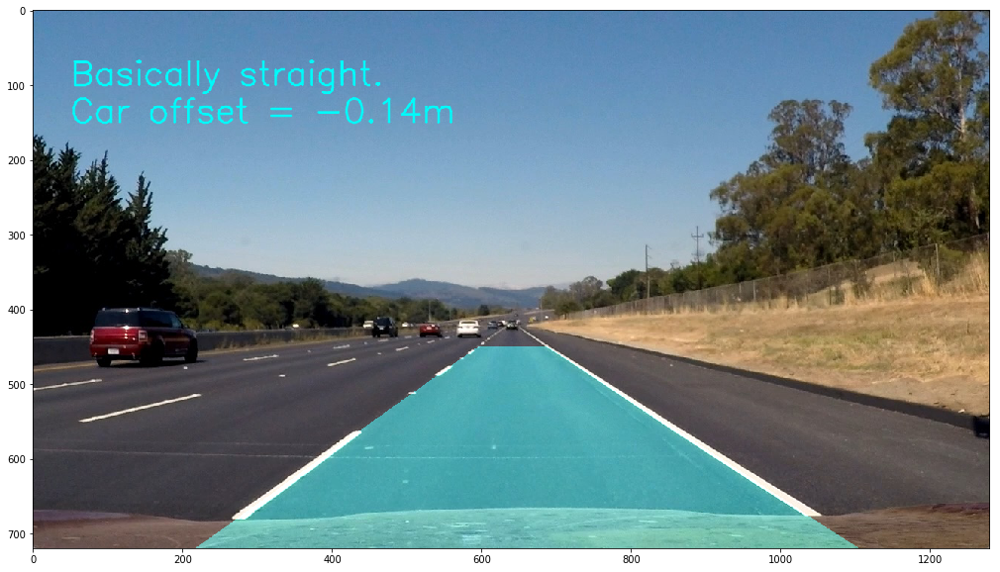

In [306]:
image1 = mpimg.imread(images[4])
plt.imshow(image1)

# Pipeline the input image
image_to_fit, Minv = pipeline(image1, objpoints, imgpoints)

# First step for first poly
res, left_p, right_p, lx, ly, rx, ry = fit_polynomial(image_to_fit)

# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(image_to_fit, lx, ly, rx, ry)
offset = measure_offset(image_to_fit, left_p, right_p)

# Draw the curve data
draw_curve_sizes(image1, (left_curverad, right_curverad), offset)

# Show lane overlay
plt.figure(figsize = (20, 10))
plt.imshow(draw_result_warped(image1, image_to_fit, left_p, right_p, Minv))
plt.savefig("output_images/result_output.jpg")

In [307]:
# Make these global
left_p = []
right_p = []
fail = 0

def process_image(img):
    
    global left_p
    global right_p
    
    # Do pipeline
    img_bin, Minv = pipeline(img, objpoints, imgpoints)
    
    # First step for first poly
    if ((len(left_p) < 1) or (len(right_p) < 1)):
        lane_image, lp, rp, lx, ly, rx, ry = fit_polynomial(img_bin, False)
        left_p = lp
        right_p = rp
    else:
        #lane_image, new_left_p, new_right_p, lx, ly, rx, ry = search_around_poly(img_bin, left_p, right_p)
        lane_image, new_left_p, new_right_p, lx, ly, rx, ry = search_around_poly_without_image(img_bin, left_p, right_p)
        left_p = new_left_p
        right_p = new_right_p
    
    # Calculate the radius of curvature in meters for both lane lines
    left_curverad, right_curverad = measure_curvature_real(img_bin, lx, ly, rx, ry)
    offset = measure_offset(img_bin, left_p, right_p)

    # Draw the curve data
    draw_curve_sizes(img, (left_curverad, right_curverad), offset)
    
    # Draw the warped on the base image
    result = draw_result_warped(img, img_bin, left_p, right_p, Minv)
    
    return result

In [308]:
# Process pipeline with aditional information

def process_image_ex(img):
    
    global left_p
    global right_p
    global fail
    
    # Undistort step
    undist = undistort([np.copy(img)], objpoints, imgpoints)[0]
    
    # Perspective step - birds eye view
    warped, Minv = perspective_transform(undist, src, dst)
    
    # Thresholding
    imgt = combine_all_thresholds(warped)
    
    # Do pipeline
    img_bin, Minv = pipeline(img, objpoints, imgpoints)
    
    # First step for first poly
    if ((len(left_p) < 1) or (len(right_p) < 1) or (fail >= 0)):
        lane_image, lp, rp, lx, ly, rx, ry = fit_polynomial(img_bin, False)
        left_p = lp
        right_p = rp
        new_left_p = lp
        new_right_p = rp
    else:
        lane_image, new_left_p, new_right_p, lx, ly, rx, ry = search_around_poly(img_bin, left_p, right_p)
        #lane_image, new_left_p, new_right_p, lx, ly, rx, ry = search_around_poly_without_image(img_bin, left_p, right_p)
    
    left_curverad, right_curverad = measure_curvature_real(img_bin, lx, ly, rx, ry)
    
    unfit_curves = (np.abs(left_curverad) > np.abs(3 * right_curverad)) or (np.abs(right_curverad) > np.abs((3 * left_curverad)))

        
    if ((left_curverad <= 250) or (right_curverad <= 250) or (unfit_curves == True)):
        fail = fail + 1
    else:
        fail = 0
        right_p = new_right_p
        left_p = new_left_p

    offset = measure_offset(img_bin, left_p, right_p)
    
    # Draw the curve data
    draw_curve_sizes(img, (left_curverad, right_curverad), offset)
    
    output = draw_result_warped(img, img_bin, left_p, right_p, Minv) # function that warp image back to perspective view
    output1 = cv2.resize(np.dstack((imgt, imgt, imgt)) * 255,(640, 360), interpolation = cv2.INTER_AREA)
    output2 = cv2.resize(lane_image,(640, 360), interpolation = cv2.INTER_AREA)

    # Create an array big enough to hold both images next to each other.
    vis = np.zeros((720, 1280 + 640, 3))

    # Copy both images into the composed image.
    vis[:720, :1280,:] = output
    vis[:360, 1280:1920,:] = output1
    vis[360:720, 1280:1920,:] = output2

    return vis

# Videos

In [69]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [309]:
%matplotlib inline
output1 = 'project_video_output.mp4'
#input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
#input1 = VideoFileClip('project_video.mp4').subclip(37,42)
#input1 = VideoFileClip('project_video.mp4').subclip(17,26)
input1 = VideoFileClip('project_video.mp4').subclip(22,24)
processed_video = input1.fl_image(process_image)
#processed_video = input1.fl_image(process_image_ex)
%time processed_video.write_videofile(output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


 98%|█████████▊| 50/51 [01:09<00:01,  1.43s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1min 6s, sys: 160 ms, total: 1min 6s
Wall time: 1min 13s


In [313]:
output1 = 'project_video_output.mp4'
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output1))

In [233]:
%matplotlib inline
output2 = 'challenge_video_output.mp4'
input2 = VideoFileClip('challenge_video.mp4')#.subclip(22,26)
#input1 = VideoFileClip('project_video.mp4').subclip(37,42)
#input1 = VideoFileClip('project_video.mp4').subclip(17,26)
#input1 = VideoFileClip('project_video.mp4').subclip(22,24)
processed_video = input2.fl_image(process_image)
#processed_video = input1.fl_image(process_image_ex)
%time processed_video.write_videofile(output2, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [10:22<00:00,  1.23s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 9min, sys: 1.29 s, total: 9min 2s
Wall time: 10min 25s


In [234]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output2))